<a href="https://colab.research.google.com/github/evewinter/Projeto-IA-Detectron2/blob/main/Projeto_Detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import shutil
import zipfile

!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

project_path = "/content/projeto-deteccao-pessoas"
data_path = os.path.join(project_path, "data")
images_path = os.path.join(data_path, "images")
annotations_path = os.path.join(data_path, "annotations")

os.makedirs(images_path, exist_ok=True)
os.makedirs(annotations_path, exist_ok=True)

zip_file = "Detectron2_IA.v2i.coco.zip"

if os.path.exists(zip_file):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall("temp_roboflow")

    for folder in ['train', 'valid', 'test']:
        src_dir = os.path.join("temp_roboflow", folder)
        if os.path.exists(src_dir):
            for file in os.listdir(src_dir):
                if file.endswith((".jpg", ".jpeg", ".png")):
                    shutil.move(os.path.join(src_dir, file), os.path.join(images_path, file))
                elif file.endswith(".json"):
                    shutil.move(os.path.join(src_dir, file), os.path.join(annotations_path, f"{folder}.json"))
    print("Pastas organizadas!")
else:
    print(f"Erro: Não encontrei o arquivo {zip_file}. Verifique se fez o upload.")

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-i3hwvk9a
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-i3hwvk9a
  Resolved https://github.com/facebookresearch/detectron2.git to commit fd27788985af0f4ca800bca563acdb700bb890e2
  Preparing metadata (setup.py) ... done
Pastas organizadas!


In [ ]:
import torch, detectron2
from detectron2.utils.logger import setup_logger
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.data.datasets import register_coco_instances

setup_logger()

register_coco_instances("my_dataset_train", {}, f"{annotations_path}/train.json", images_path)
register_coco_instances("my_dataset_test", {}, f"{annotations_path}/test.json", images_path)

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 800
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

print("Iniciando treinamento")
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()
print("Treinamento concluído!")

Iniciando treinamento
[01/21 19:36:54 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[01/21 19:36:54 d2.engine.train_loop]: Starting training from iteration 0
[01/21 19:37:10 d2.utils.events]:  eta: 0:09:55  iter: 19  total_loss: 1.809  loss_cls: 1.002  loss_box_reg: 0.6712  loss_rpn_cls: 0.1274  loss_rpn_loc: 0.01592    time: 0.8068  last_time: 0.7689  data_time: 0.3902  last_data_time: 0.3096   lr: 6.1816e-06  max_mem: 3028M
[01/21 19:37:27 d2.utils.events]:  eta: 0:09:50  iter: 39  total_loss: 1.691  loss_cls: 0.9212  loss_box_reg: 0.5896  loss_rpn_cls: 0.135  loss_rpn_loc: 0.01189    time: 0.8215  last_time: 0.9263  data_time: 0.3960  last_data_time: 0.5538   lr: 1.2425e-05  max_mem: 3028M
[01/21 19:37:43 d2.utils.events]:  eta: 0:09:34  iter: 59  total_loss: 1.587  loss_cls: 0.7865  loss_box_reg: 0.6786  loss_rpn_cls: 0.1036  loss_rpn_loc: 0.01313    time: 0.8103  last_time: 0.8302  data_time: 0.3362  last_data_time: 0.3764   lr: 1.8669e-05  max_mem: 3028M
[01/21 19:37:58 d2.utils.events]:  eta: 0:09:14  iter: 79  total_loss: 1.442  loss_cls: 0.6352  loss_box_reg:

[01/21 19:48:01 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...

Calculando Métricas de Desempenho
WARNING [01/21 19:48:01 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/21 19:48:01 d2.data.datasets.coco]: Loaded 3 images in COCO format from /content/projeto-deteccao-pessoas/data/annotations/test.json
[01/21 19:48:01 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|  pessoas   | 0            |   person   | 5            |
|            |              |            |              |
|   total    | 5            |            |              |
[01/21 19:48:01 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/21 19:48:01 d2.d

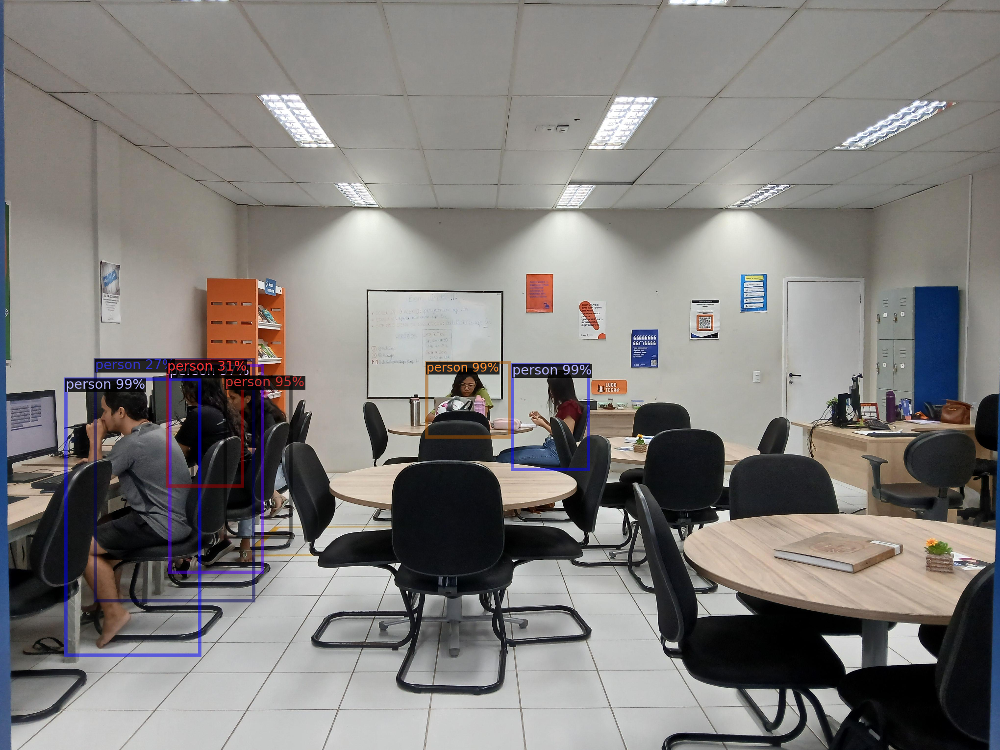

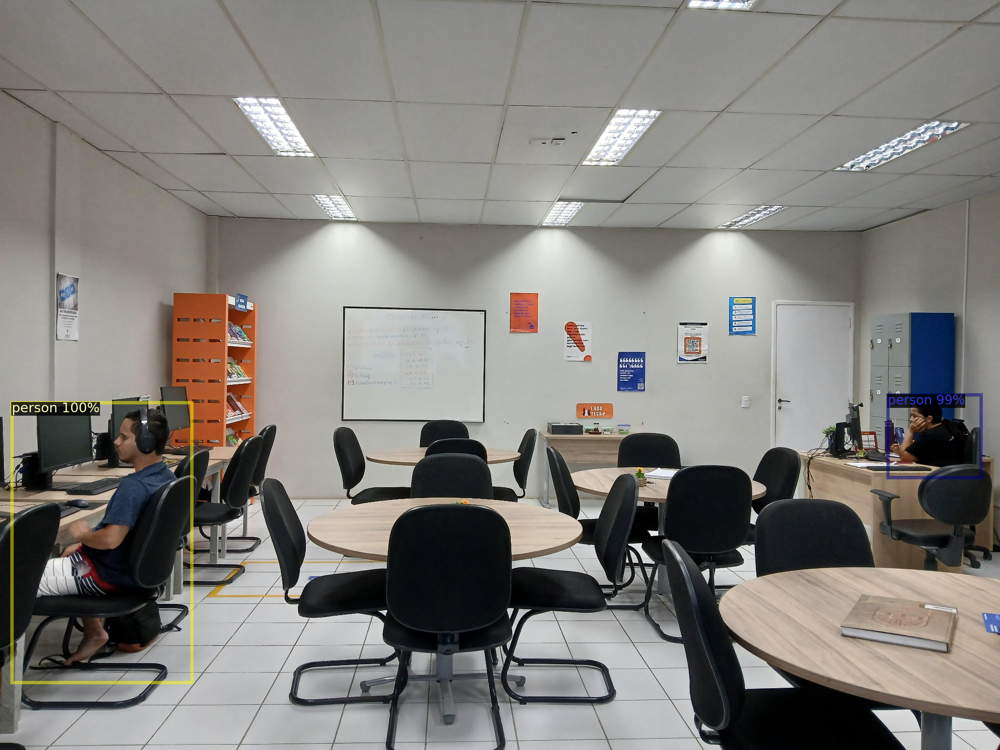

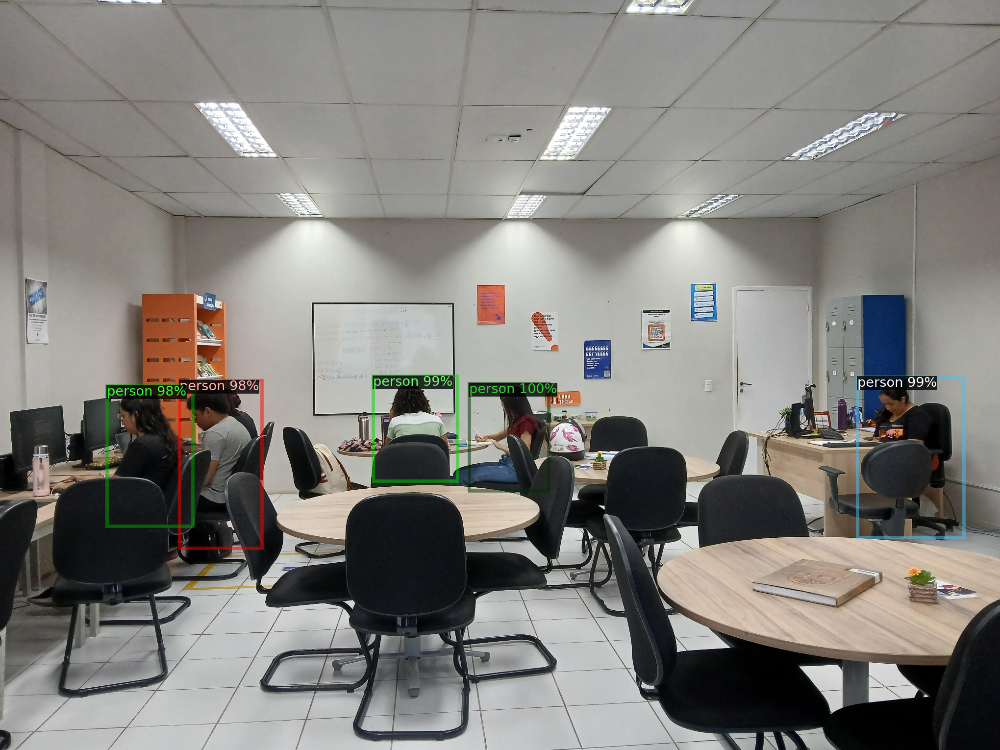

In [ ]:
from detectron2.engine import DefaultPredictor
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
import cv2
import random
from google.colab.patches import cv2_imshow

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2
predictor = DefaultPredictor(cfg)

print("\nCalculando Métricas de Desempenho")
evaluator = COCOEvaluator("my_dataset_test", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

print("\nExemplos de Detecção no Conjunto de Teste:")
dataset_dicts = DatasetCatalog.get("my_dataset_train")
metadata = MetadataCatalog.get("my_dataset_test")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)

    v = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

Escolha uma imagem para testar:


Saving 20260113_095713.jpg to 20260113_095713.jpg

Resultado para: 20260113_095713.jpg


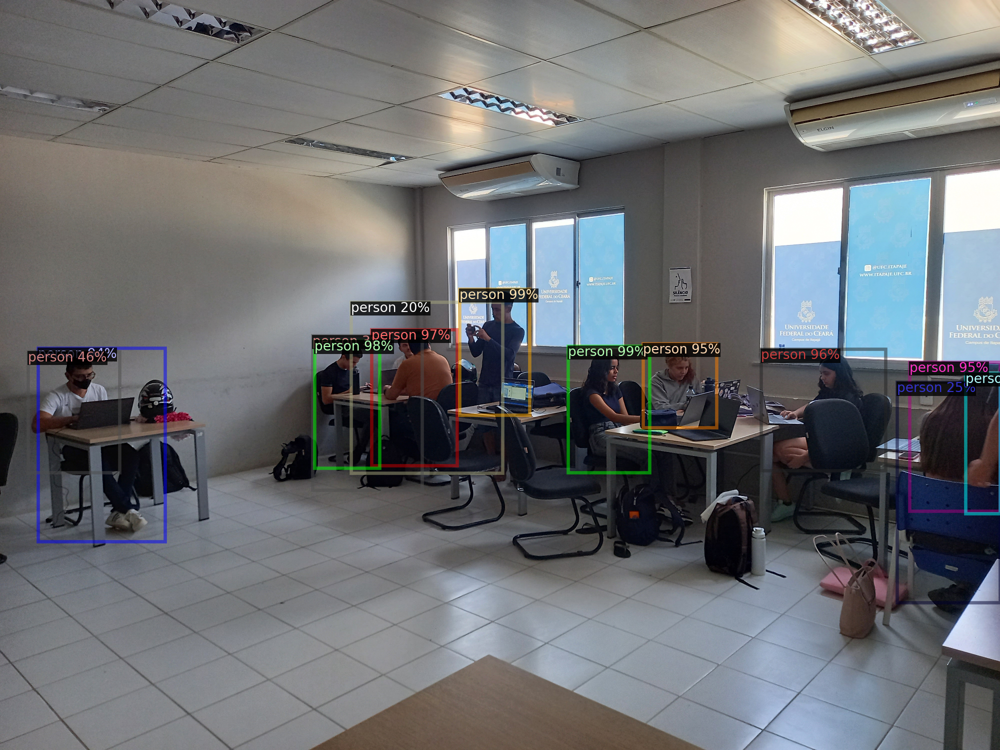

In [ ]:
from google.colab import files
import cv2
from detectron2.utils.visualizer import Visualizer
from google.colab.patches import cv2_imshow

print("Escolha uma imagem para testar:")
uploaded = files.upload()

for filename in uploaded.keys():
    img = cv2.imread(filename)

    outputs = predictor(img)

    from detectron2.data import MetadataCatalog
    metadata = MetadataCatalog.get("my_dataset_train")

    v = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    print(f"\nResultado para: {filename}")
    cv2_imshow(out.get_image()[:, :, ::-1])